## Import Libraries

In [6]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)
import shap
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier
import xgboost as xgb

## Load the dataset

In [2]:
df_x = pd.read_csv("x_train.csv") # features
df_y = pd.read_csv("y_train.csv") # label

# Example placeholder:
X_train = df_x
y_train = df_y["label"]

In [4]:
print("X shape:", X_train.shape)
print("y shape:", y_train.shape)

X shape: (228312, 20)
y shape: (228312,)


## ANN (FNN-based)

### FNN parameters

In [ ]:
mlp = MLPClassifier(
    max_iter=200,
    solver="adam",
    random_state=42
)

param_grid = {
    "hidden_layer_sizes": [
        (64,),
        (128,),
        (64, 32)
    ],
    "activation": ["relu", "tanh"],
    "alpha": [1e-4, 1e-3, 1e-2],          # L2 regularization
    "learning_rate_init": [1e-3, 5e-3],
    "batch_size": [32, 64, 128]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=mlp,
    param_grid=param_grid,
    scoring="roc_auc_ovr",     # choose AUC-ROC for model selection
    cv=cv,
    n_jobs=-1,
    verbose=2
)

In [8]:
# Grid-search CV
grid_search.fit(X_train, y_train)

# Best parameters selection
print("\nBest parameters found:")
print(grid_search.best_params_)

print(f"\nBest CV AUC-ROC: {grid_search.best_score_:.4f}")

# Select the best model
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  17.7s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  22.1s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  23.0s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  23.5s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  38.3s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; total time=  47.8s
[CV] END activation=relu, alpha=0.0001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; total time=  48.9s
[CV] END activation=relu, alpha=0.0001, batch_size=32, 

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, alpha=0.0001, batch_size=64, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 2.7min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.005; total time=  22.3s
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.005; total time=  35.6s
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.005; total time=  40.1s
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.005; total time=  29.3s
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.005; total time=  39.5s
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0.001; total time= 1.5min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(128,), learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 2.0min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.005; total time= 1.5min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 1.9min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 1.9min


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 2.1min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.005; total time= 1.2min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.005; total time= 1.4min
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; total time=  20.4s


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.001; total time= 2.0min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.005; total time= 1.8min
[CV] END activation=tanh, alpha=0.0001, batch_size=128, hidden_layer_sizes=(64, 32), learning_rate_init=0.005; total time= 1.3min
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  13.4s
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.005; total time=  21.1s
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; total time=  23.7s
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; total time=  28.6s
[CV] END activation=tanh, alpha=0.001, batch_size=32, hidden_layer_sizes=(64,), learning_rate_init=0.001; tota

### Test set evaluation

In [9]:
df_x_test = pd.read_csv("x_test.csv") # features
df_y_test = pd.read_csv("y_test.csv") # label

X_test = df_x_test
y_test = df_y_test["label"]

In [11]:
# predictions
y_pred = best_model.predict(X_test)
y_proba = best_model.predict_proba(X_test)   # shape = (n_samples, 3)

# ===== MULTI-CLASS METRICS =====
accuracy = accuracy_score(y_test, y_pred)

precision = precision_score(y_test, y_pred, average="macro", zero_division=0)
recall = recall_score(y_test, y_pred, average="macro", zero_division=0)
f1 = f1_score(y_test, y_pred, average="macro", zero_division=0)

# ROC-AUC for multi-class (One-vs-Rest)
auc_roc = roc_auc_score(y_test, y_proba, multi_class="ovr")

print("\n=== Test Set Performance ===")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro)   : {recall:.4f}")
print(f"F1-score (macro) : {f1:.4f}")
print(f"AUC-ROC (OvR)    : {auc_roc:.4f}")



=== Test Set Performance ===
Accuracy : 0.8496
Precision (macro): 0.4657
Recall (macro)   : 0.4146
F1-score (macro) : 0.4277
AUC-ROC (OvR)    : 0.7826


### SHAP analysis (FNN)

In [27]:
import shap
import numpy as np

# Use a small background sample to speed things up
background = X_train.sample(50, random_state=42)

# KernelExplainer must wrap predict_proba properly
explainer = shap.KernelExplainer(
    lambda x: best_model.predict_proba(x),
    background
)

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test_values)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


  0%|          | 0/25368 [00:00<?, ?it/s]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/skle

In [24]:
print(best_model.feature_names_in_)


['HighBP' 'HighChol' 'CholCheck' 'BMI' 'Smoker' 'Stroke'
 'HeartDiseaseorAttack' 'PhysActivity' 'Fruits' 'Veggies'
 'HvyAlcoholConsump' 'NoDocbcCost' 'GenHlth' 'MentHlth' 'PhysHlth'
 'DiffWalk' 'Sex' 'Age' 'Education' 'Income']


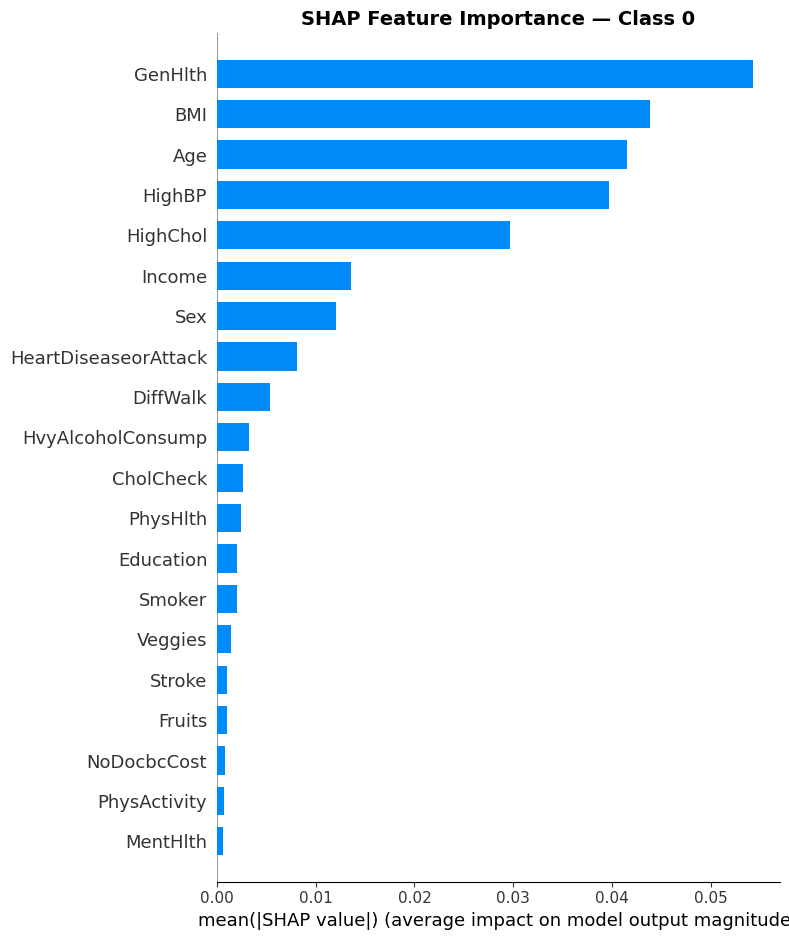

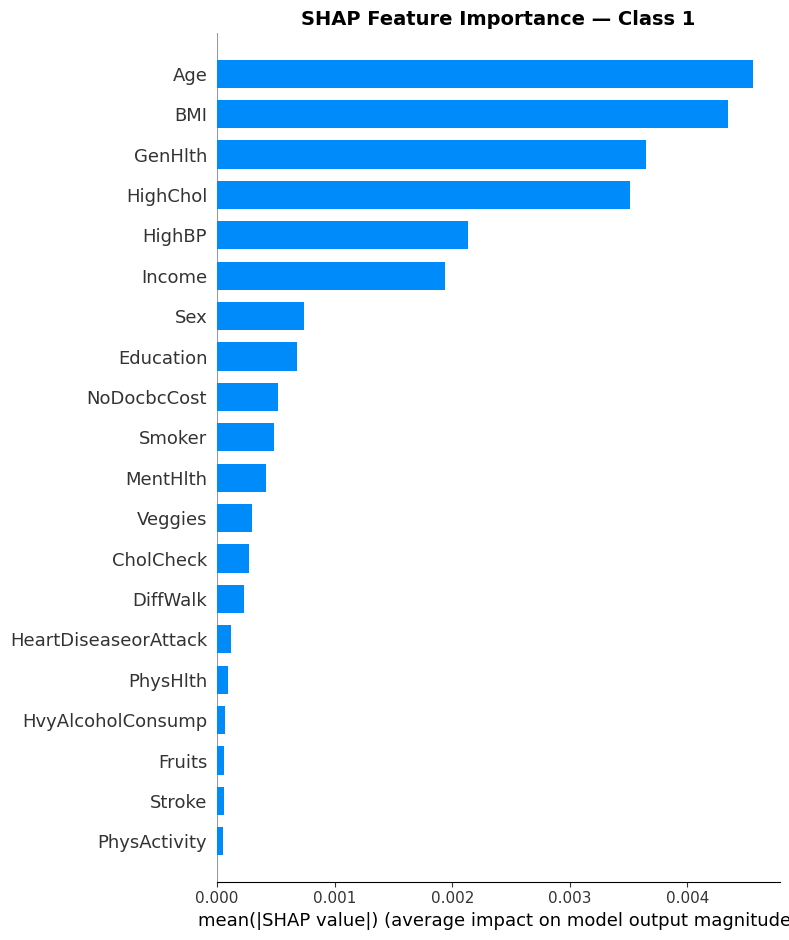

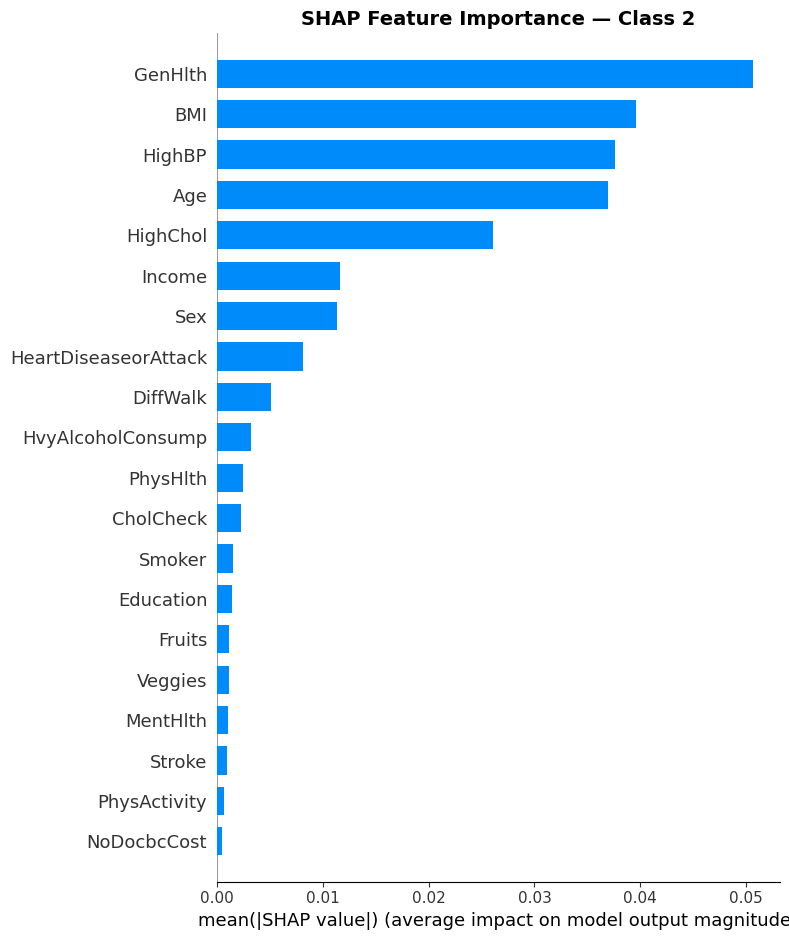

In [45]:
feature_list = X_test.columns.tolist()   # your 20 features

for class_idx in range(len(shap_values)):
    shap_vals = shap_values[class_idx]   # SHAP array for this class
    
    plt.figure(figsize=(12, 6))

    shap.summary_plot(
        shap_vals,
        X_test_values,
        plot_type="bar",
        show=False,
        feature_names=feature_list
    )

    plt.title(f"SHAP Feature Importance — Class {class_idx}", 
              fontsize=14, fontweight='bold')

    # Remove extra colorbar that legacy SHAP adds
    if len(plt.gcf().axes) > 1:
        plt.gcf().axes[-1].remove()

    plt.tight_layout()
    plt.savefig(f"shap_summary_bar_class_{class_idx}.png",
                dpi=300, bbox_inches='tight')
    plt.show()


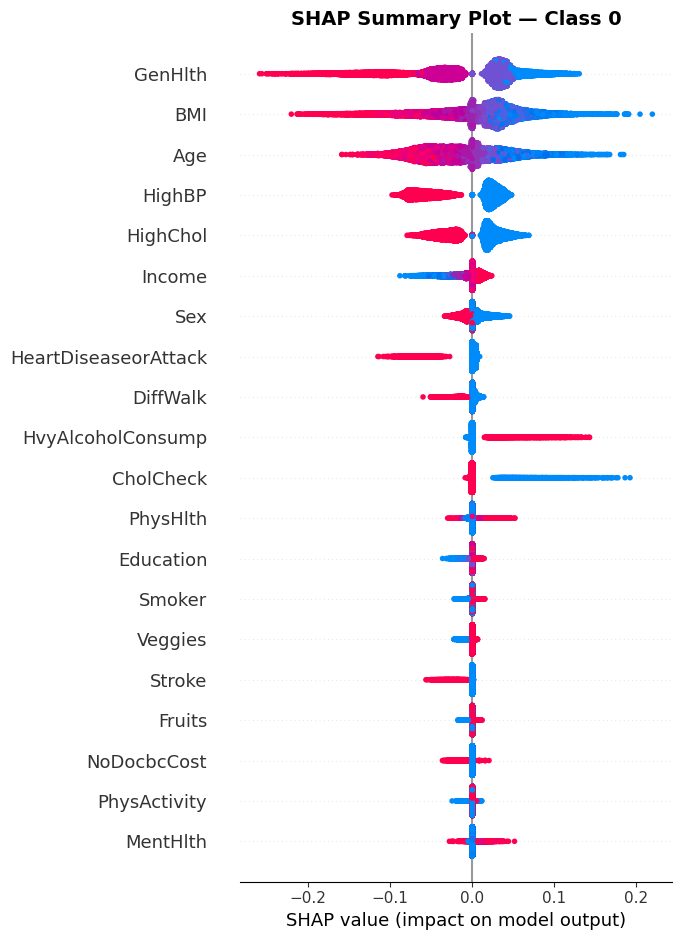

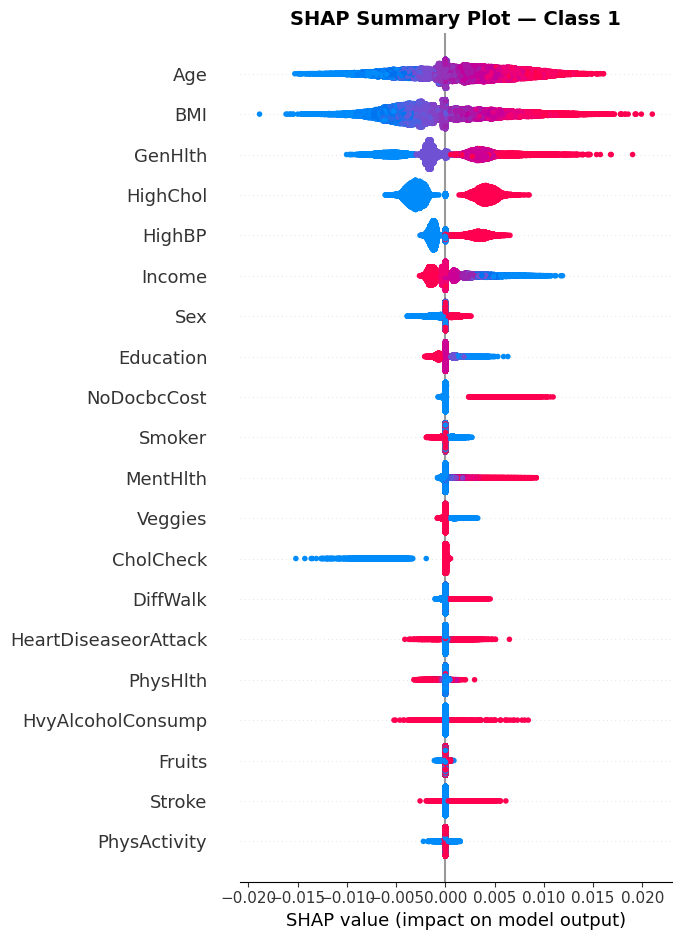

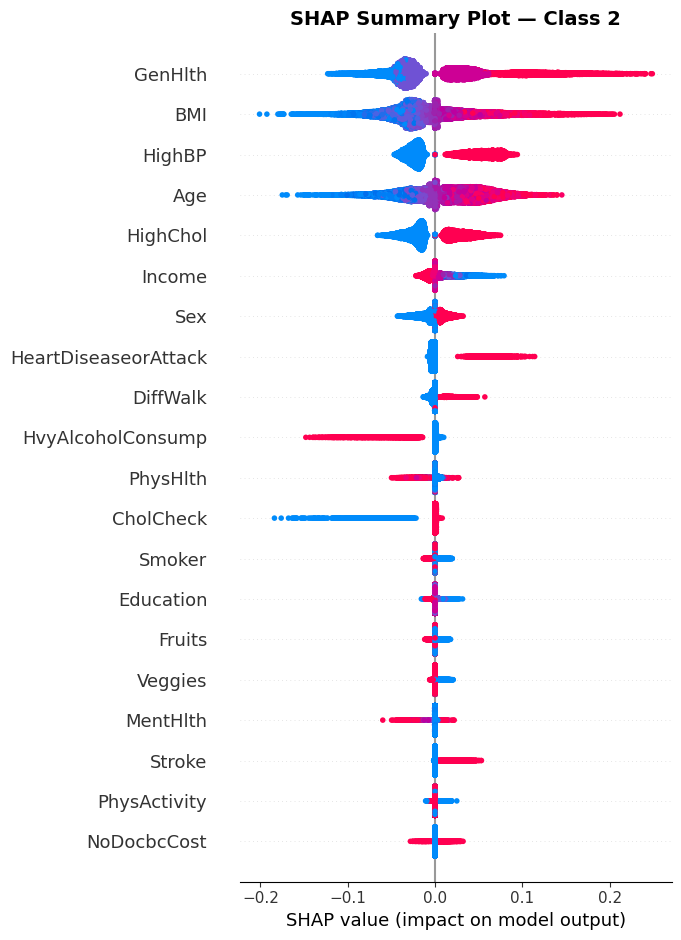

In [43]:
for class_idx in range(len(shap_values)):
    shap_vals = shap_values[class_idx]   # SHAP array for this class
    
    plt.figure(figsize=(10, 7))

    # Beeswarm plot (legacy SHAP friendly)
    shap.summary_plot(
        shap_vals,
        X_test,                          # DataFrame ensures feature names appear
        feature_names=X_test.columns,
        show=False
    )

    plt.title(f"SHAP Summary Plot — Class {class_idx}", fontsize=14, fontweight='bold')

    # Remove any auto-added extra colorbar axes (common in legacy SHAP)
    if len(plt.gcf().axes) > 1:
        plt.gcf().axes[-1].remove()

    plt.tight_layout()
    plt.show()


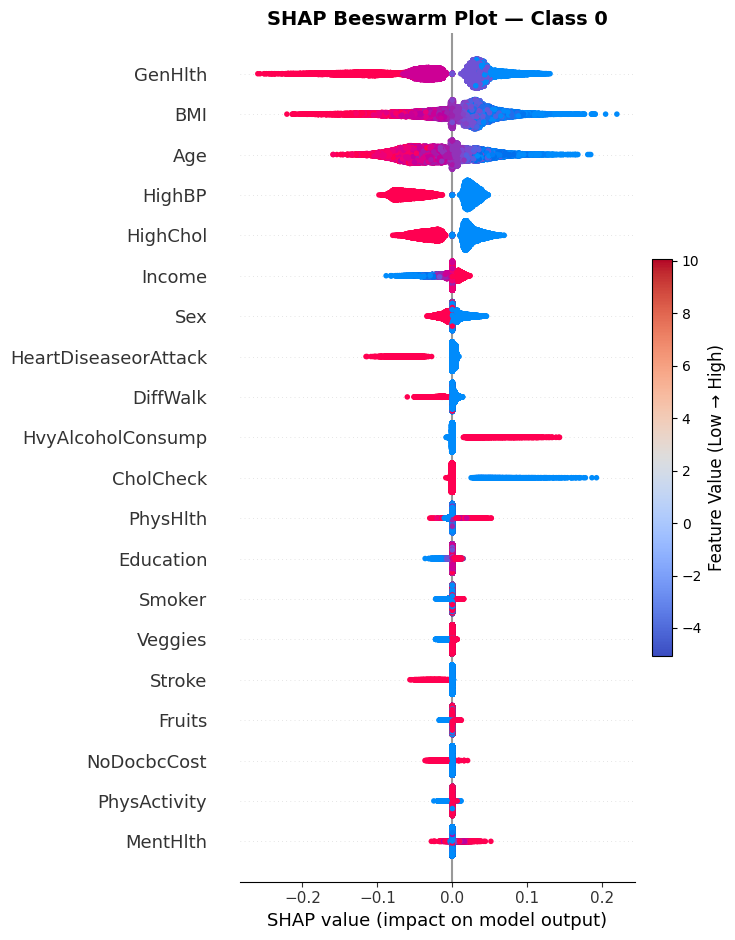

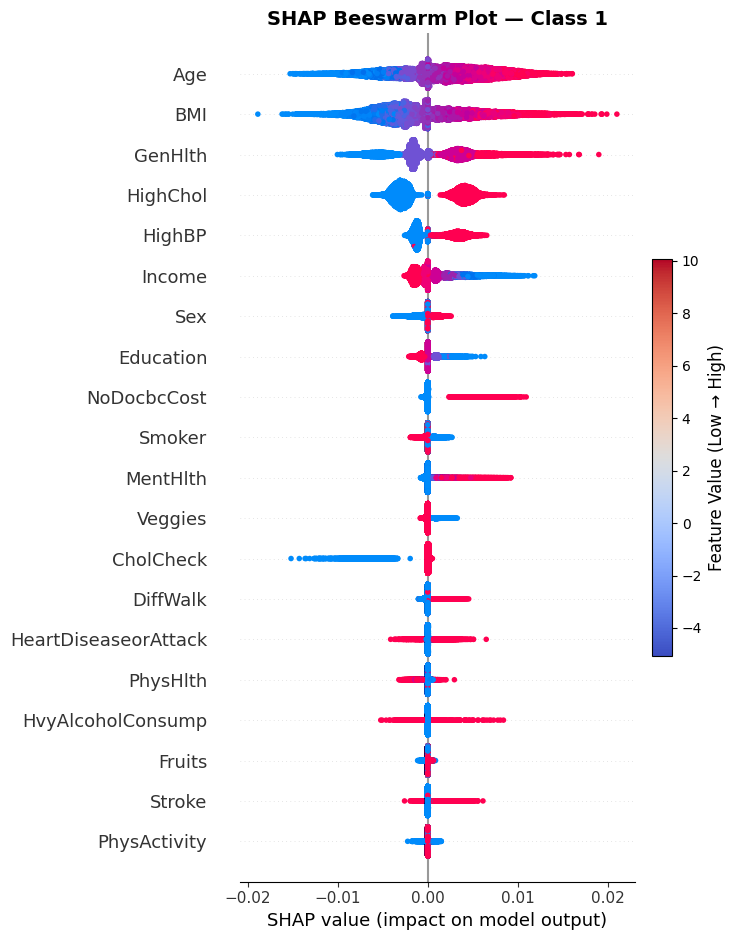

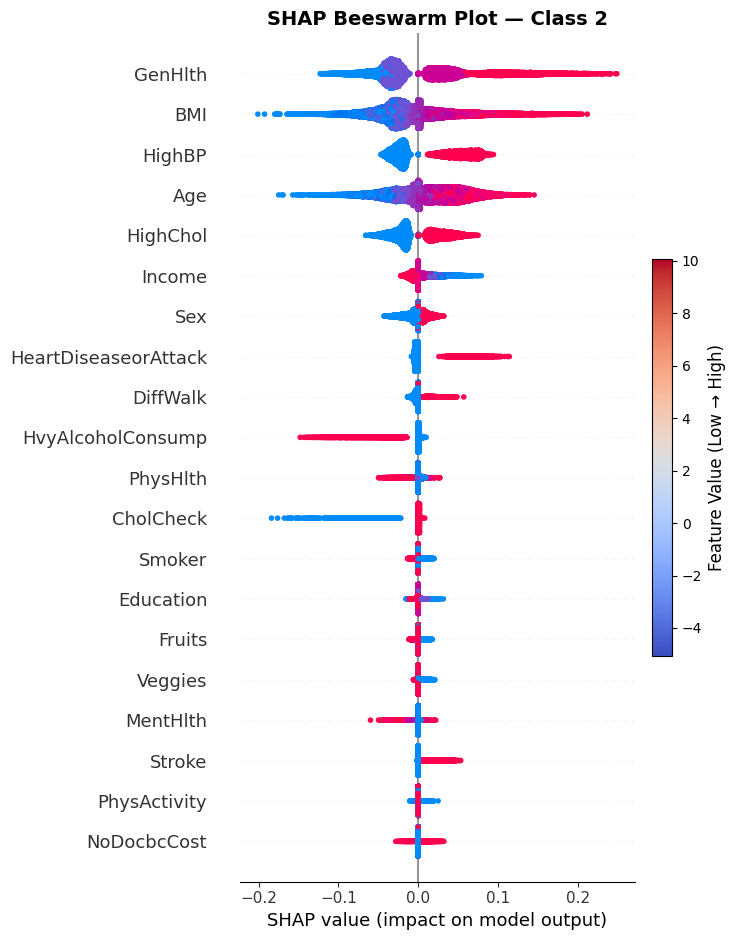

In [46]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

for class_idx in range(len(shap_values)):
    shap_vals = shap_values[class_idx]

    fig, ax = plt.subplots(figsize=(10, 7))

    # --- Beeswarm plot (SHAP draws on the current Axes) ---
    shap.summary_plot(
        shap_vals,
        X_test,
        feature_names=X_test.columns,
        show=False
    )

    ax.set_title(f"SHAP Beeswarm Plot — Class {class_idx}", fontsize=14, fontweight='bold')

    # --- Remove any accidental extra axes (legacy SHAP adds colorbar axes sometimes) ---
    axes = fig.get_axes()
    if len(axes) > 1:
        # axes[1] is usually the unwanted colorbar axis
        axes[1].remove()

    # --- Create a fake ScalarMappable so Matplotlib can build a colorbar ---
    # Use SHAP's default coolwarm colormap
    cmap = plt.cm.coolwarm

    # Normalize by global feature range
    vmin = np.min(X_test.values)
    vmax = np.max(X_test.values)
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  # Avoids warnings

    # --- Add colorbar to the SAME axis SHAP used ---
    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Feature Value (Low → High)", fontsize=12)

    fig.tight_layout()
    plt.show()
